In [1]:
def nearest_frame(time_start, time_end, coordinate_df):
    #returns a tuple of the nearest frame numbers
    #for the start
    diff = []
    for idx, i in coordinate_df.loc[:, "timestamp"].items():
        diff.append([idx, np.abs(time_start - i)])
    start_idx = Sort(diff)[0][0]
    #for the end
    diff_end = []
    for idx, i in coordinate_df.loc[:,"timestamp"].items():
        diff.append([idx, np.abs(time_end - i)])
    end_idx = Sort(diff_end)[0][0]
    return (coordinate_df.loc[start_idx, "frame"], coordinate_df.loc[end_idx, "frame"])

In [2]:
import numpy as np
import pandas as pd
from pupil_functions import *
import platform
from shutil import copyfile
from find_blob import *

# tracking delay
## TCB_GOOD

In [3]:
col = ["block", "trial", "task", "sent", "received"]
timesTCB = pd.DataFrame(columns = col)

In [4]:
dfTCB = load_manual_annotations("/Users/selena_zhang/Desktop/000")

In [5]:
#change none's to nearest numbers
for idx, num in dfTCB.iloc[:, 4].items():
    if num == None:
        point = idx
        while point >= 0:
            #finds the nearest filled cell that is before it
            point -= 1
            val = dfTCB.iloc[point, 4]
            if val is not None:
                dfTCB.at[idx, "trial"] = val
                break
#first two must be manually done
dfTCB.at[0, "trial"] = 1
dfTCB.at[1, "trial"] = 1

In [6]:
dfTCB[5:15]

,block,exp_event,task,timestamp,trial
5,1,Image onset for trial 1 in block 1,Image onset,1.591225e+09,1
6,None,image onset,,1.591225e+09,1
7,None,testing_image_onset,,1.591225e+09,1
8,None,adjust,,1.591225e+09,1
9,1,Adjust Task begins for trial 1 in block 1,Adjust task,1.591225e+09,1
10,1,Adjust Task ends for trial 1 in block 1,,1.591225e+09,1
11,1,Ending trial 1 in block 1,End trial,1.591225e+09,1
12,1,Begin for trial 2 in block 1,Trial begins,1.591225e+09,2
13,1,Fixation dot begins for trial 2 in block 1,Fixation dot,1.591225e+09,2
14,None,fixation,,1.591225e+09,2


In [7]:
for idx, event in dfTCB.iterrows():
    #first 10 trials
    if float(dfTCB.iloc[idx, 4]) > 10:
        break
    #fixation
    if dfTCB.iloc[idx, 2] == "Fixation dot":
        task = "Fixation dot"
        trial = dfTCB.iloc[idx, 4]
        block = dfTCB.iloc[idx, 0]
        sent = dfTCB.iloc[idx, 3]
        if dfTCB.iloc[idx + 1, 1] == "fixation":
            received = dfTCB.iloc[idx + 1, 3]
        else:
            received = dfTCB.iloc[idx - 1, 3]
        row = [block, trial, task, sent, received]
        timesTCB.loc[len(timesTCB), :] = row
    #image onset
    elif dfTCB.iloc[idx, 2] == "Image onset":
        task = "Image onset"
        trial = dfTCB.iloc[idx, 4]
        block = dfTCB.iloc[idx, 0]
        sent = dfTCB.iloc[idx, 3]
        if dfTCB.iloc[idx + 1, 1] == "image onset":
            received = dfTCB.iloc[idx + 1, 3]
        else:
            received = dfTCB.iloc[idx - 1, 3]        
        row = [block, trial, task, sent, received]
        timesTCB.loc[len(timesTCB), :] = row
    elif dfTCB.iloc[idx, 2] == "Adjust task":
        task = "Adjust task"
        trial = dfTCB.iloc[idx, 4]
        block = dfTCB.iloc[idx, 0]
        sent = dfTCB.iloc[idx, 3]
        if dfTCB.iloc[idx + 1, 1] == "adjust":
            received = dfTCB.iloc[idx + 1, 3]
        else:
            received = dfTCB.iloc[idx - 1, 3]
        row = [block, trial, task, sent, received]
        timesTCB.loc[len(timesTCB), :] = row
    else:
        pass

In [8]:
timesTCB["delay"] = timesTCB["sent"] - timesTCB["received"]

In [9]:
avg = timesTCB["delay"].mean()

In [10]:
if avg < 0:
    timesTCB["fixedlag"] = timesTCB["received"] + avg #avg was negative
elif avg > 0:
    timesTCB["fixedlag"] = timesTCB["received"] - avg

In [11]:
timesTCB

,block,trial,task,sent,received,delay,fixedlag
0,1,1,Fixation dot,1.59123e+09,1.59123e+09,-0.0300457,1.59123e+09
1,1,1,Image onset,1.59123e+09,1.59123e+09,-0.139507,1.59123e+09
2,1,1,Adjust task,1.59123e+09,1.59123e+09,0.00205851,1.59123e+09
3,1,2,Fixation dot,1.59123e+09,1.59123e+09,-0.0401266,1.59123e+09
4,1,2,Image onset,1.59123e+09,1.59123e+09,-0.0865505,1.59123e+09
5,1,2,Adjust task,1.59123e+09,1.59123e+09,-0.00968146,1.59123e+09
6,1,3,Fixation dot,1.59123e+09,1.59123e+09,-0.0155714,1.59123e+09
7,1,3,Image onset,1.59123e+09,1.59123e+09,-0.0523214,1.59123e+09
8,1,3,Adjust task,1.59123e+09,1.59123e+09,-0.0153713,1.59123e+09
9,1,4,Fixation dot,1.59123e+09,1.59123e+09,-0.0435736,1.59123e+09


In [12]:
#for the binary SD marker
TCBbehavioral = pd.read_csv("/Users/selena_zhang/Desktop/000/TCB_VM_output_-1nBack.csv")

In [13]:
def SDlabel_trials1(behavioral_df):
    trial_unique = behavioral_df.trialNumber.unique()
    block_unique = behavioral_df.blockNumber.unique()
    behavioral_df["SD_CONDITION"] = ""
    row = 0
    for idx, col in behavioral_df.iterrows():
        if (behavioral_df.loc[row, "Stim_diff"] < 0) & (behavioral_df.loc[row, "responseError"] < 0):
            behavioral_df.at[row, "SD_CONDITION"] == "SD"
            row += 1
        elif (behavioral_df.loc[row, "Stim_diff"] > 0) & (behavioral_df.loc[row, "responseError"] > 0):
            behavioral_df.at[row, "SD_CONDITION"] == "SD"
            row += 1
        elif np.isnan(behavioral_df.loc[row, "Stim_diff"]) or np.isnan(behavioral_df.loc[row, "responseError"]):
            row += 1
        else:
            behavioral_df.at[row, "SD_CONDITION"] == "NO_SD"
            row += 1
    return behavioral_df

In [14]:
SDlabel_trials1(TCBbehavioral)

,stimulusID,morphID,RT,trialNumber,blockNumber,stimLocationDeg,shifted_stimulusID,shifted_stimLocationDeg,shifted_morphID,Error,responseError,Stim_diff,Stim_Loc_diff,bootstrap_values,Running_Mean,slopes,intercepts,DoVM,SD_CONDITION
0,81.0,86.0,1.214150,1.0,1.0,142.0,50.0,247.0,47.0,-3.0,-3.000000,31.0,-105.0,2.175724,-0.443572,0.164390,0.251218,-3.801264e-19,
1,50.0,47.0,2.031325,2.0,1.0,247.0,77.0,65.0,81.0,4.0,3.997763,-27.0,-178.0,3.836778,-0.151244,0.256575,1.705796,-1.340351e-04,
2,77.0,81.0,2.982389,3.0,1.0,65.0,145.0,220.0,125.0,-20.0,-20.000000,-68.0,-155.0,2.689834,-0.151244,0.303582,-0.711443,-2.708124e-04,
3,145.0,125.0,2.935164,4.0,1.0,220.0,119.0,165.0,103.0,-16.0,-16.000000,26.0,55.0,3.910172,-0.060910,0.356560,-0.611051,-4.131581e-04,
4,119.0,103.0,2.170834,5.0,1.0,165.0,64.0,101.0,66.0,2.0,1.999554,55.0,64.0,0.716972,-0.083347,0.080926,0.218555,-5.640693e-04,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
244,46.0,51.0,4.196066,80.0,3.0,272.0,126.0,7.0,120.0,-6.0,-2.502850,66.0,-95.0,NaN,NaN,NaN,NaN,NaN,
245,126.0,120.0,7.843110,81.0,3.0,7.0,62.0,274.0,42.0,-20.0,-20.000446,64.0,93.0,NaN,NaN,NaN,NaN,NaN,
246,62.0,42.0,2.058722,82.0,3.0,274.0,5.0,108.0,13.0,8.0,8.003690,57.0,166.0,NaN,NaN,NaN,NaN,NaN,
247,5.0,13.0,3.374745,83.0,3.0,108.0,68.0,237.0,64.0,-4.0,-3.999999,-63.0,-129.0,NaN,NaN,NaN,NaN,NaN,


In [15]:
#cropping out subset that have blobs
timestampframe = pd.read_csv("/Users/selena_zhang/Desktop/000/preprocessed/pl_timestamps.csv", header=None)
messages = pd.read_csv("/Users/selena_zhang/Desktop/000/preprocessed/pl_msgs.csv")

In [16]:
timestampframe

,0
0,0.000000e+00
1,1.591225e+09
2,1.591225e+09
3,1.591225e+09
4,1.591225e+09
...,...
51626,1.591228e+09
51627,1.591228e+09
51628,1.591228e+09
51629,1.591228e+09


In [17]:
#timestamps of first trial blob
trial = 1
block = 1
begintask = "Image onset"
endtask = "Adjust task"
msg_idx = messages[(messages['task'] == begintask) & (messages['trial'] == trial) & (messages['block'] == block)].index.values
begin_ts = messages.loc[msg_idx[0], "timestamp"]
msg_end_idx = messages[(messages['task'] == endtask) & (messages['trial'] == trial) & (messages['block'] == block)].index.values
end_ts = messages.loc[msg_end_idx[0], 'timestamp']
#correct the lag
if avg > 0:
    begin_ts_lag = begin_ts - avg
    end_ts_lag = end_ts - avg
elif avg < 0:
    begin_ts_lag = begin_ts + avg
    end_ts_lag = end_ts + avg

In [18]:
def nearest_ts(time, ts_frame, task):
    #time = corrected time after delay, ts_frame=DF with timestamps, task = 'begin' or 'end'
    timediff = []
    for idx, ts in ts_frame.iloc[:, 0].items():
        diff = ts-time
        if diff < 0: 
            timediff.append(diff)
        elif diff > 0:
            if task=='begin':
                best_ts = timediff[-1]
                best_frame = idx + 1
            elif task=='end':
                best_ts = ts
                best_frame = idx + 2
            break
        else: 
            best_frame = idx + 1
            break
    return best_frame


In [19]:
#best frame number
begin_frame = nearest_ts(begin_ts_lag, timestampframe, 'begin')
end_frame = nearest_ts(end_ts_lag, timestampframe, 'end')

In [20]:
print(begin_frame)
print(end_frame)

4016
4082


In [21]:
#subset out frames from one trial

if platform.system() == 'Darwin':
    EM_path = '/Users/selena_zhang/Desktop/000/'    
elif platform.system() == 'Linux':
    EM_path = '/media/whitney/New Volume/Teresa/SD_grant_EM/TCB_GOOD/000/'

subset_path = EM_path + 'block' + str(block) + 'trial' + str(trial) + 'frames'
frames_path = EM_path + 'frames'

try:
    if not os.path.exists(subset_path):
        os.mkdir(subset_path)
        print("Successfully created the directory %s " % subset_path)
    else:
        print("Directory already exists %s " % subset_path)
except OSError:
    print("Creation of the directory %s failed" % subset_path)

Directory already exists /Users/selena_zhang/Desktop/000/block1trial1frames 


In [22]:
#copy files into trial1frames from frames (full)
for i in range(begin_frame, end_frame + 1):
    if os.path.isfile(subset_path + str(i) + ".png"):
        pass
    else:
        copyfile(frames_path + "/frame" + str(i) + ".png", subset_path + "/frame" + str(i) + ".png")

In [23]:
#make new df
blob_coords = pd.DataFrame(columns=["trial", "frame", "timestamp", "topleft", "topright", "bottomleft", "bottomright", "blobcenter", "screencenter"])

In [24]:
correct_tags = [0, 1, 2, 3, 5, 6, 7, 8, 9, 11]

Progress: |██████████████████████████████████████████████████| 100.0% Complete
Progress: |██████████████████████████████████████████████████| 100.0% Complete
Progress: |██████████████████████████████████████████████████| 100.0% Complete
Progress: |██████████████████████████████████████████████████| 100.0% Complete
Progress: |██████████████████████████████████████████████████| 100.0% Complete
Progress: |██████████████████████████████████████████████████| 100.0% Complete
Progress: |██████████████████████████████████████████████████| 100.0% Complete
Progress: |██████████████████████████████████████████████████| 100.0% Complete
Progress: |██████████████████████████████████████████████████| 100.0% Complete
Progress: |██████████████████████████████████████████████████| 100.0% Complete
Progress: |██████████████████████████████████████████████████| 100.0% Complete
Progress: |██████████████████████████████████████████████████| 100.0% Complete
Progress: |█████████████████████████████████████████

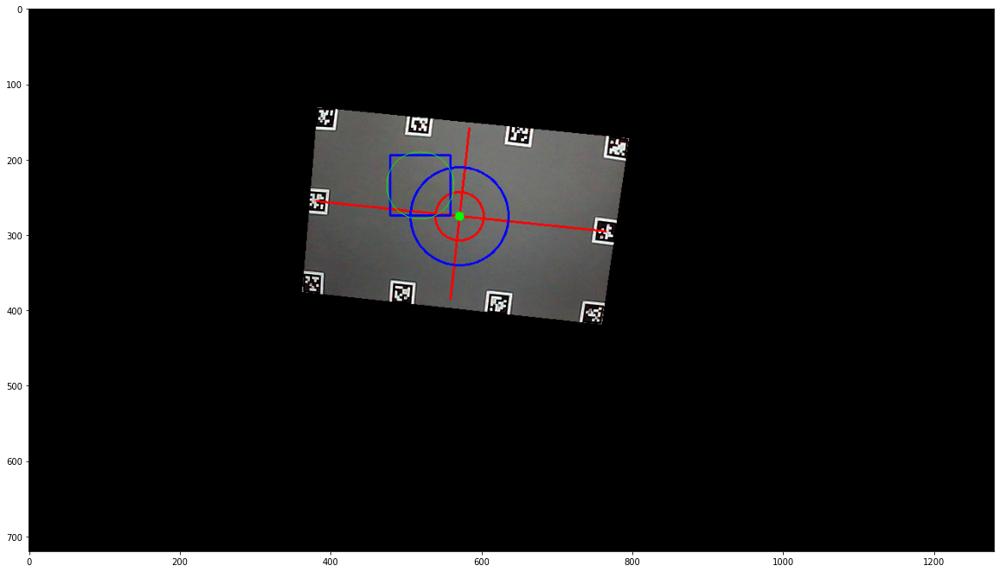

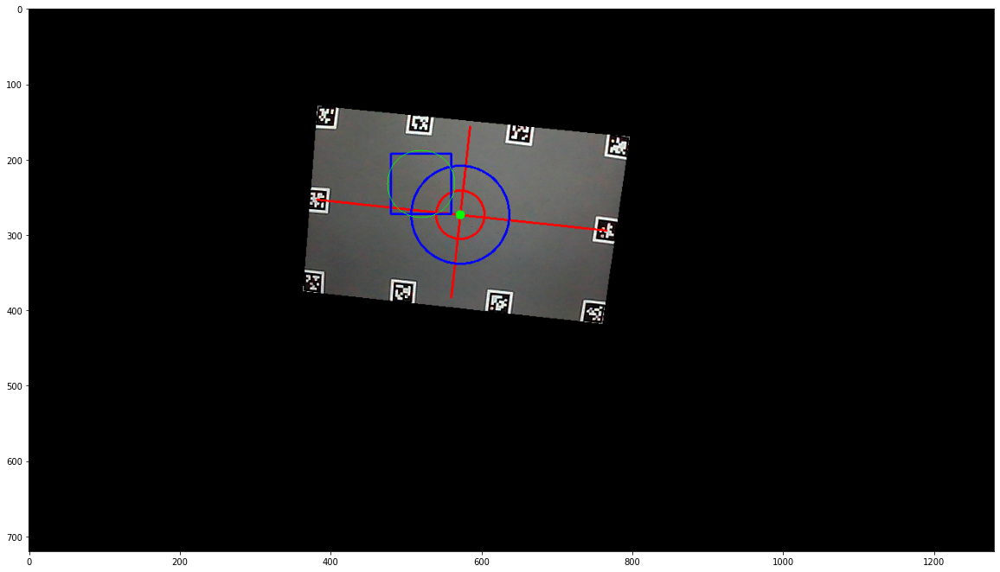

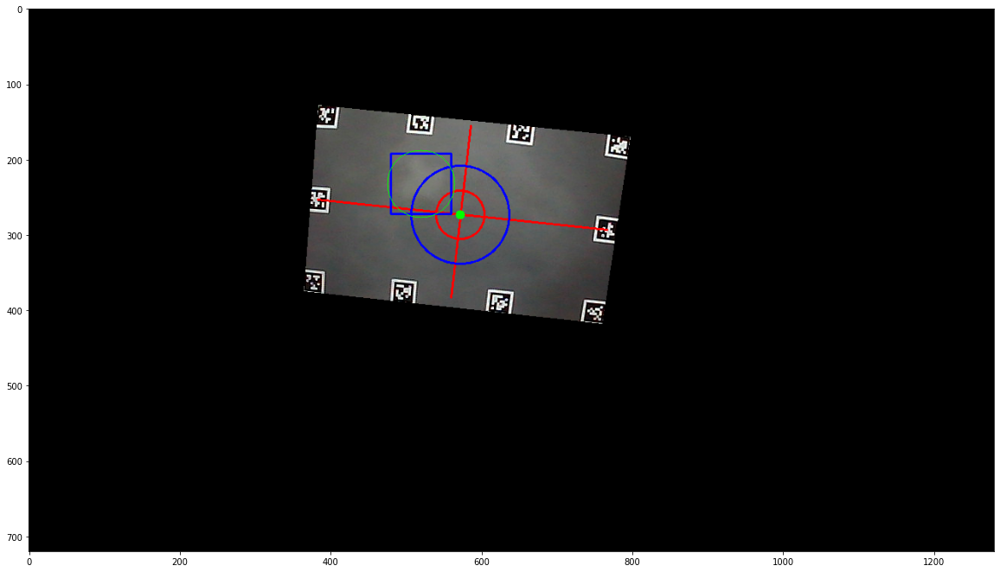

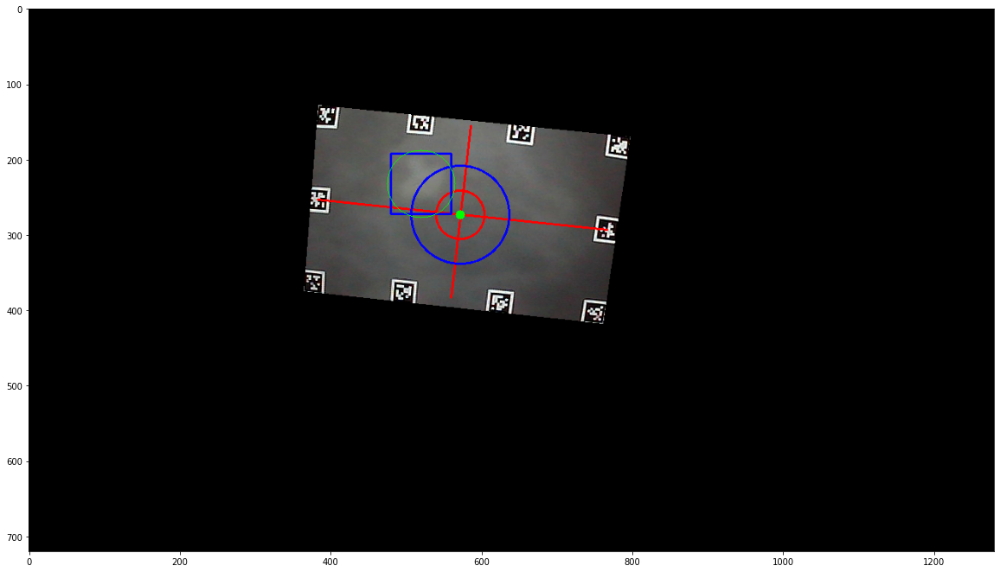

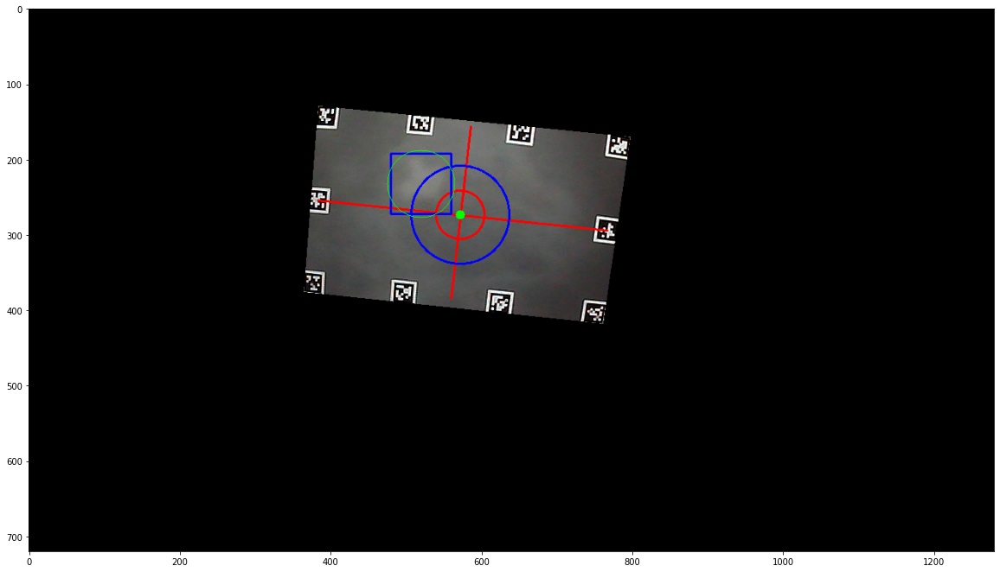

...

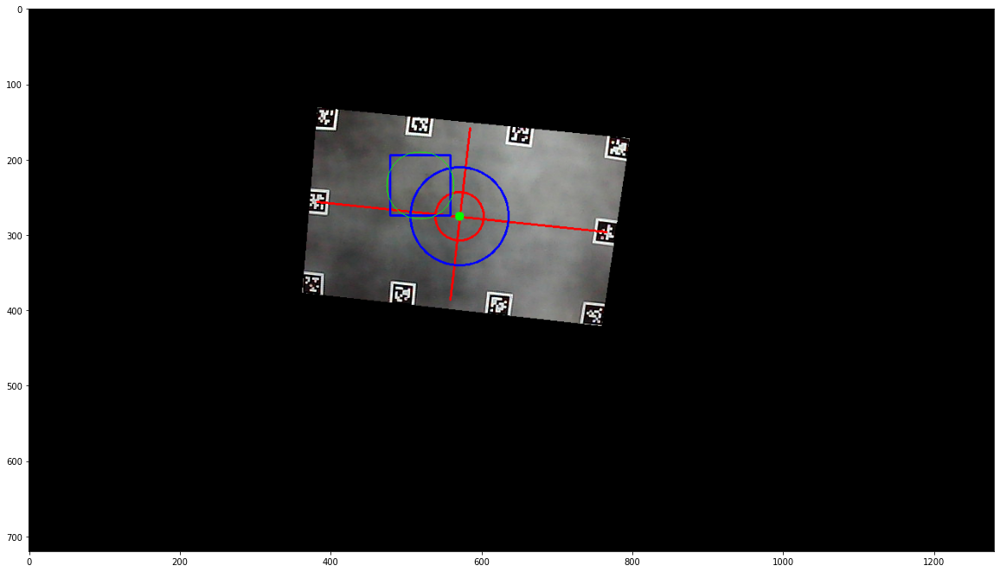

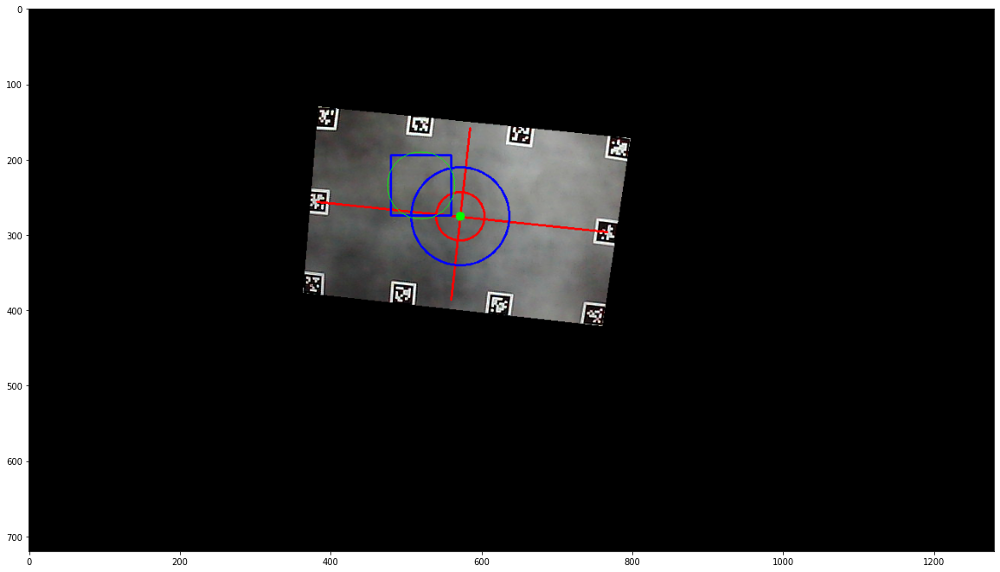

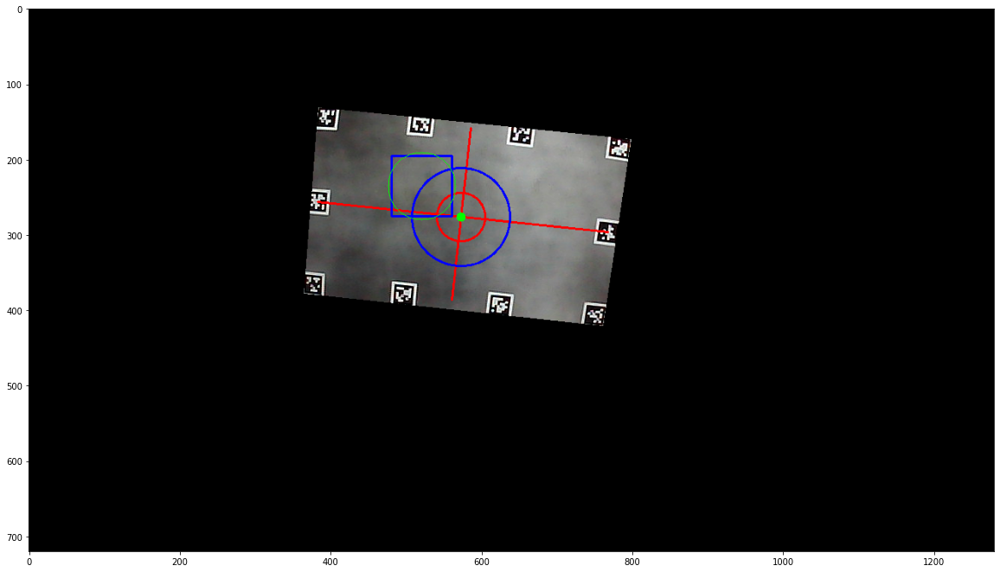

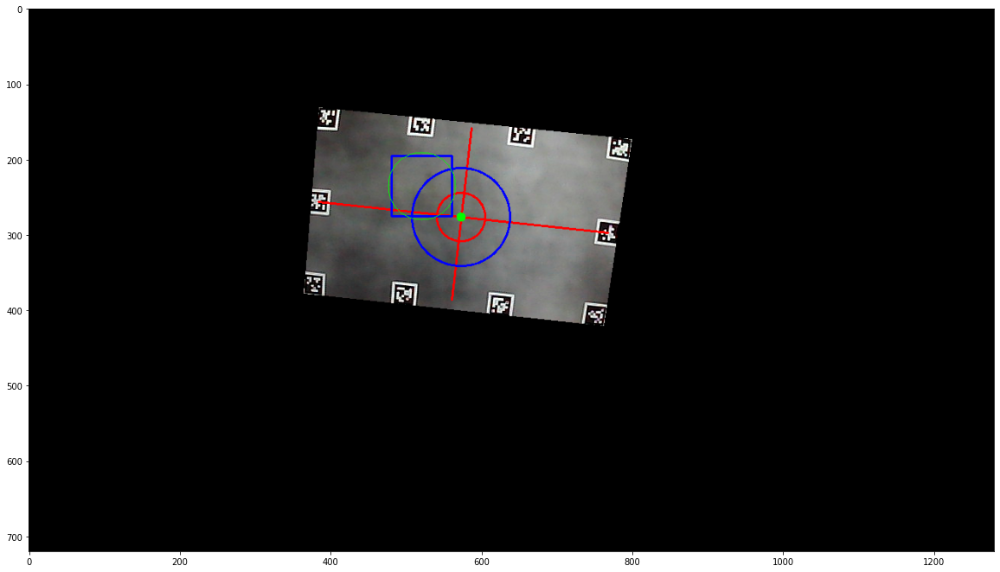

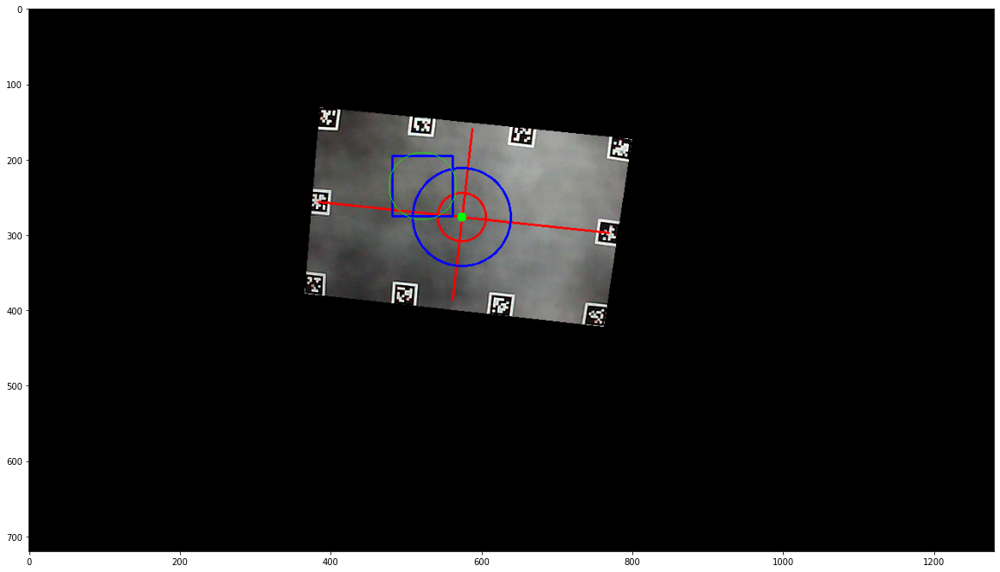

In [25]:

#run find_blob on frames in subset
def blob_finder(bframe, eframe, trial, block):
    row = TCBbehavioral[(TCBbehavioral["trialNumber"] == trial) & (TCBbehavioral['blockNumber'] == block)].index.values[0]
    degree = TCBbehavioral.loc[row, "stimLocationDeg"]
    #do for first 30 frames
    for i in range(bframe, bframe + 31): 
        blob = find_blob(subset_path + "/frame" + str(i) + ".png", correct_tags, degree, draw=True, show=True)
        tright= (blob[2][0], blob[1][1])
        bleft = (blob[1][0], blob[2][1])
        values = [trial, i, timestampframe.iloc[i+1, 0], blob[1], tright, bleft, blob[2], blob[0], blob[3]]
        blob_coords.loc[len(blob_coords), :] = values
blob_finder(begin_frame, end_frame, trial, block)

In [26]:
blob_coords

,trial,frame,timestamp,topleft,topright,bottomleft,bottomright,blobcenter,screencenter
0,1,4016,1.59123e+09,"(479, 194)","(559, 194)","(479, 274)","(559, 274)","(519.7793011288919, 234.98200395877785)","(571, 275)"
1,1,4017,1.59123e+09,"(480, 192)","(560, 192)","(480, 272)","(560, 272)","(520.7793011288919, 232.98200395877785)","(572, 273)"
2,1,4018,1.59123e+09,"(480, 192)","(560, 192)","(480, 272)","(560, 272)","(520.7793011288919, 232.98200395877785)","(572, 273)"
3,1,4019,1.59123e+09,"(480, 192)","(560, 192)","(480, 272)","(560, 272)","(520.7793011288919, 232.98200395877785)","(572, 273)"
4,1,4020,1.59123e+09,"(480, 192)","(560, 192)","(480, 272)","(560, 272)","(520.7793011288919, 232.98200395877785)","(572, 273)"
5,1,4021,1.59123e+09,"(480, 193)","(560, 193)","(480, 273)","(560, 273)","(520.7793011288919, 233.98200395877785)","(572, 274)"
6,1,4022,1.59123e+09,"(480, 194)","(560, 194)","(480, 274)","(560, 274)","(520.7793011288919, 234.98200395877785)","(572, 275)"
7,1,4023,1.59123e+09,"(480, 195)","(560, 195)","(480, 275)","(560, 275)","(520.7793011288919, 235.98200395877785)","(572, 276)"
8,1,4024,1.59123e+09,"(479, 195)","(559, 195)","(479, 275)","(559, 275)","(519.7793011288919, 235.98200395877785)","(571, 276)"
9,1,4025,1.59123e+09,"(479, 196)","(559, 196)","(479, 276)","(559, 276)","(519.7793011288919, 236.98200395877785)","(571, 277)"


In [27]:
# trial 1
# code crops 4016-4082, blob exists 4018-4040
# trial 2
# code crops 4179-4244, blob exists 4180-4201
# trial 3
# code crops 4312-4376, blob exists 4312-4333
# trial 4
# code crops 4475-4541, blob exists 4476-4498

print(4041-4017)
print(4201-4179)
print(4333-4311)
print(4498-4475)

24
22
22
23


In [28]:
def in_circle(point, radius, center):
    print(np.sqrt(((point[0] - center[0])**2) + ((point[1] - center[1])**2)))
    if np.sqrt(((point[0] - center[0])**2) + ((point[1] - center[1])**2)) <= radius:
        return 1
    else:
        return 0

In [29]:
def Sort_Tuple(tup):  
      
    # getting length of list of tuples 
    lst = len(tup)  
    for i in range(0, lst):  
          
        for j in range(0, lst-i-1):  
            if (tup[j][1] > tup[j + 1][1]):  
                temp = tup[j]  
                tup[j]= tup[j + 1]  
                tup[j + 1]= temp  
    return tup

In [30]:
def nearest_trial(df, timestamp, task):
    #df = timestampframe, timestamp from fixation data
    timediff = []
    for idx, ts in df.iloc[:, 0].items():
        diff = ts-time
        if diff < 0: 
            timediff.append(diff)
        elif diff > 0:
            if task=='start':
                best_ts = timediff[-1]
                best_frame = idx
            elif task=='end':
                best_ts = ts
                best_frame = idx + 2
            break
        else: 
            best_frame = idx + 1
            break
    return best_frame

In [31]:
#find all fixations
events = pd.read_csv("/Users/selena_zhang/Desktop/000/preprocessed/pl_events.csv")
events[events['type']=='fixations']

,start_gy,end_time,amplitude,mean_gx,end_gy,type,start_time,duration,surface,mean_gy,peak_velocity,start_gx,dispersion,end_gx
0,NaN,1.591225e+09,NaN,0.411640,NaN,fixations,1.591225e+09,217.893124,False,0.753231,NaN,NaN,0.249325,NaN
1,NaN,1.591225e+09,NaN,0.412554,NaN,fixations,1.591225e+09,217.891932,False,0.755868,NaN,NaN,0.312620,NaN
2,NaN,1.591225e+09,NaN,0.459066,NaN,fixations,1.591225e+09,185.611963,False,0.651620,NaN,NaN,1.116495,NaN
3,NaN,1.591225e+09,NaN,0.456121,NaN,fixations,1.591225e+09,217.892885,False,0.615756,NaN,NaN,1.160027,NaN
4,NaN,1.591225e+09,NaN,0.453560,NaN,fixations,1.591225e+09,217.892885,False,0.614473,NaN,NaN,0.260084,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10406,NaN,1.591228e+09,NaN,0.457663,NaN,fixations,1.591228e+09,217.891932,True,0.695950,NaN,NaN,1.159662,NaN
10407,NaN,1.591228e+09,NaN,0.461520,NaN,fixations,1.591228e+09,209.822178,True,0.658468,NaN,NaN,1.079326,NaN
10408,NaN,1.591228e+09,NaN,0.443573,NaN,fixations,1.591228e+09,185.611963,True,0.553849,NaN,NaN,0.589779,NaN
10409,NaN,1.591228e+09,NaN,0.422318,NaN,fixations,1.591228e+09,217.892170,True,0.537053,NaN,NaN,1.084603,NaN


In [32]:
fixation_df = pd.DataFrame(columns=['trial', 'block', 'start_time', 'end_time', 'duration', 'frames', 'fixation_center', 'dispersion', 'on_center', 'on_blob'])
fixation_events = events[events['type']=='fixations']

In [33]:
def Sort(sub_li): 
    l = len(sub_li) 
    for i in range(0, l): 
        for j in range(0, l-i-1): 
            if (sub_li[j][1] > sub_li[j + 1][1]): 
                tempo = sub_li[j] 
                sub_li[j]= sub_li[j + 1] 
                sub_li[j + 1]= tempo 
    return sub_li 

In [34]:
def draw_fixations(frame_path, fix_coords):
    red = (255, 0, 0)
    green = (0, 255, 0)
    blue = (0, 0, 255)
    image = cv2.imread(frame_path)
    image = cv2.circle(image, fix_coords, 2, red, 8)
    #save
    try:
        cv2.imwrite(frame_path, image)
    except OSError:
        print('couldnt save file, check paths and editing permission')


In [44]:
for idx, time in fixation_events.loc[:, 'start_time'].items():
    if (time >= begin_ts_lag) and (time <= end_ts_lag) and (fixation_events.loc[idx, "surface"]==True):
        print(fixation_events.loc[idx, 'surface'])
        #find the frame range
        start_frame = nearest_trial(timestampframe, time, 'start')
        end_frame = nearest_trial(timestampframe, fixation_events.loc[idx, 'end_time'], 'end')
        frame_range = (start_frame, end_frame)
        #collect info from fixation_events
        mean_gaze = (fixation_events.loc[idx, 'mean_gx']*1280, fixation_events.loc[idx, 'mean_gy']*720)
        #draw on frames
        #perform in_circle
        blob_result = 0
        blobs = []
        for j in [start_frame, end_frame + 1]:
            coords_idx = blob_coords[blob_coords['frame'] == j].index.values
            if len(coords_idx) != 0:
                df_idx = coords_idx[0]
                radius = ((-blob_coords.loc[df_idx, "topleft"][0] + blob_coords.loc[df_idx, "bottomright"][0])/2) + 5
                in_blob = in_circle(mean_gaze, radius, blob_coords.loc[df_idx, 'blobcenter'])
                blobs.append(in_blob)
        if 1 in blobs:
            blob_result = 1
        
        centers = []
        center_result = 0
        for j in [start_frame, end_frame + 1]:
            coords_idx = blob_coords[blob_coords['frame'] == j].index.values
            if len(coords_idx) != 0:
                df_idx = coords_idx[0]
                in_center = in_circle(mean_gaze, 65/2, blob_coords.loc[df_idx, 'screencenter'])
                centers.append(in_center)
        if 1 in centers:
            center_result = 1
        new_line = [trial, block, time, fixation_events.loc[idx, 'end_time'], fixation_events.loc[idx, 'duration'], frame_range, mean_gaze, fixation_events.loc[idx, 'dispersion'], blob_result, center_result]
        #append line
        fixation_df.loc[len(fixation_df), :] = new_line

True
241.17962110916216
238.40260135343595
187.6537711110678
184.72205196505
True
237.1889331056679
235.35375539192856
182.8387815829718
180.8946992705681
True
251.96178225452653
252.66144526589295
203.42987259436757
204.3506414875979
True
255.2207208301625
257.1527311778716
207.0045344285204
208.99932081462504
True
260.8959796503024
259.42316366198463
212.7669929961458
211.63264810253327
True
True
True
True
True


In [36]:
fixation_df

,trial,block,start_time,end_time,duration,frames,fixation_center,dispersion,on_center,on_blob
0,1,1,1.59123e+09,1.59123e+09,217.893,"(4020, 4022)","(611.4962527468385, 443.7710488468687)",0.267618,0,0
1,1,1,1.59123e+09,1.59123e+09,80.7011,"(4027, 4029)","(611.7035823359181, 442.14912451023145)",0.153066,0,0
2,1,1,1.59123e+09,1.59123e+09,217.893,"(4030, 4032)","(585.0592013076814, 468.4118129675423)",1.15581,0,0
3,1,1,1.59123e+09,1.59123e+09,217.892,"(4037, 4039)","(585.0088894341338, 471.00249267508605)",0.200234,0,0
4,1,1,1.59123e+09,1.59123e+09,169.472,"(4043, 4045)","(587.5031789578011, 473.668052034754)",1.37283,0,0
5,1,1,1.59123e+09,1.59123e+09,217.892,"(4053, 4055)","(622.4134826890304, 446.2734884889791)",0.639025,0,0
6,1,1,1.59123e+09,1.59123e+09,217.893,"(4060, 4062)","(623.0912247391434, 445.54797001553374)",0.199126,0,0
7,1,1,1.59123e+09,1.59123e+09,217.893,"(4067, 4069)","(609.5660380844196, 444.4594622948762)",1.31763,0,0
8,1,1,1.59123e+09,1.59123e+09,217.893,"(4074, 4076)","(604.9287294556066, 442.20356587477573)",0.32254,0,0
9,1,1,1.59123e+09,1.59123e+09,217.893,"(4080, 4082)","(606.217103295612, 439.6191383561197)",0.228968,0,0


In [37]:
example = fixation_df.loc[4, 'fixation_center']
new = (int(example[0]), int(example[1]))
new

(587, 473)

In [38]:
image = cv2.imread('/Users/selena_zhang/Desktop/000/block1trial4processed/processed_frame4504.png')
image.shape

(720, 1280, 3)

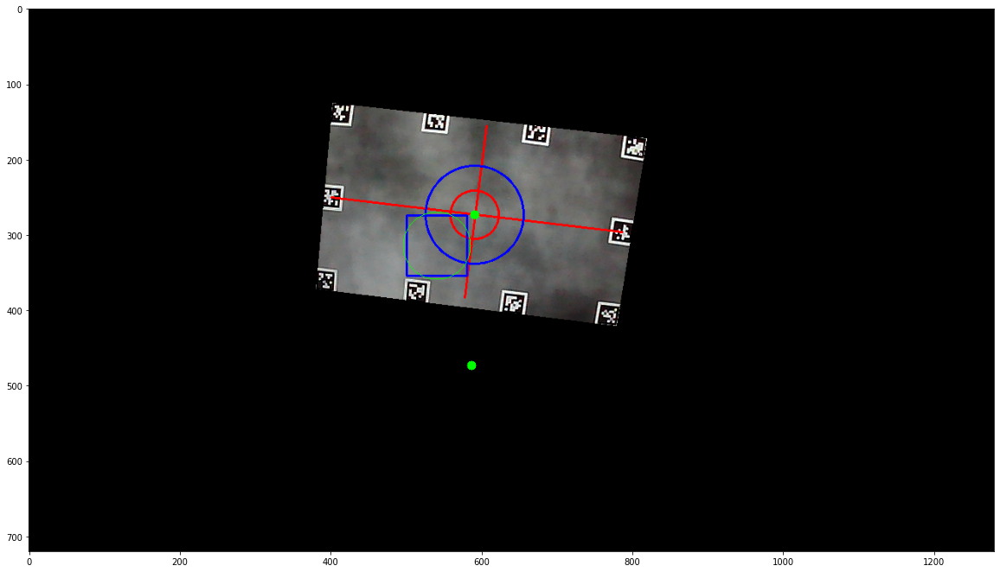

In [39]:
image = cv2.imread('/Users/selena_zhang/Desktop/000/block1trial4processed/processed_frame4504.png')
green = (0, 255, 0)
image = cv2.circle(image, new, 2, green, 8)
plt.figure(figsize=(20, 20))
plt.imshow(image)

In [40]:
#(501, 274)	(581, 274)	(501, 354)	(581, 354)

In [41]:
events[events['type']=='saccade']

,start_gy,end_time,amplitude,mean_gx,end_gy,type,start_time,duration,surface,mean_gy,peak_velocity,start_gx,dispersion,end_gx
11673,0.651113,1.591225e+09,75.500281,NaN,-68.214610,saccade,1.591225e+09,0.545833,NaN,NaN,409.729060,0.444757,NaN,47.263774
11674,0.566730,1.591225e+09,0.152135,NaN,0.613328,saccade,1.591225e+09,0.025000,NaN,NaN,8.387367,0.246438,NaN,0.391262
11675,0.636999,1.591225e+09,0.167197,NaN,0.565860,saccade,1.591225e+09,0.033333,NaN,NaN,9.818491,0.428119,NaN,0.276811
11676,0.832377,1.591225e+09,0.219792,NaN,0.656139,saccade,1.591225e+09,0.033333,NaN,NaN,7.680402,0.273348,NaN,0.404687
11677,0.737237,1.591225e+09,0.306481,NaN,0.839059,saccade,1.591225e+09,0.058333,NaN,NaN,7.836307,0.563813,NaN,0.274740
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12114,0.458757,1.591228e+09,0.085866,NaN,0.544209,saccade,1.591228e+09,0.012500,NaN,NaN,8.564073,0.488386,NaN,0.479931
12115,0.686629,1.591228e+09,0.116556,NaN,0.570136,saccade,1.591228e+09,0.016667,NaN,NaN,9.241309,0.462014,NaN,0.465950
12116,0.719353,1.591228e+09,0.117125,NaN,0.602934,saccade,1.591228e+09,0.016667,NaN,NaN,7.808811,0.448269,NaN,0.435399
12117,0.000000,1.591228e+09,0.429354,NaN,0.386341,saccade,1.591228e+09,0.008333,NaN,NaN,119.102454,0.000000,NaN,0.187313


In [42]:
#saccade df
saccade_df = pd.DataFrame(columns=['trial', 'block', 'amplitude', 'start_g', 'end_g', 'time_range', 'duration', 'frames', 'direction', 'intend_region', 'distance_error'])
saccade_events = events[events['type'] == 'saccade']

In [43]:
def screen_regions(frame, coordinates_df):
    idx = coordinates_df[coordinates_df['frame']== frame].index.values[0]
    region_1_bl = ( , )
    region_1_tr = ()
#find frame lengths
#define regions for the frames

SyntaxError: invalid syntax (<ipython-input-43-2a4c90c6848a>, line 3)